In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
df = pd.read_csv('data/final_data/nfl_merged_wide_format_no_multicollinearity.csv')
df

,Player Name,2022 Age,2022 Position,2022 Team,2022 Games Played,2022 Games Started,2022 Interceptions Thrown,2022 Rushing Touchdowns,2022 Receiving Touchdowns,2022 Fumbles,...,2024 NFL ADP,2024 RTSports ADP,2024 Average ADP,2024 Positional ADP,2024 PPR Fantasy Points Scored,2024 Standard Fantasy Points Scored,2022 Total Passing,2022 Touchdowns Allowed,2022 Receptions*Yards,2022 Carries*Yards
0,A.J. Brown,25.0,WR,PHI,17.0,16.0,NaN,0.0,11.0,2.0,...,9.0,11.0,10.2,6.0,216.9,149.9,NaN,NaN,1584.0,0.0
1,A.J. Green,34.0,WR,ARI,15.0,10.0,NaN,0.0,2.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,260.0,0.0
2,A.J. McCarron,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,A.T. Perry,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AJ Barner,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,393.0,301.0,395.0,58.0,78.5,48.5,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
965,Zander Horvath,24.0,RB,LAC,15.0,2.0,NaN,0.0,2.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,12.0
966,Zane Gonzalez,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,301.0,301.0,301.0,301.0,36.0,36.0,NaN,NaN,NaN,NaN
967,Zay Flowers,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,73.0,71.0,63.2,28.0,209.5,135.5,NaN,NaN,NaN,NaN
968,Zay Jones,27.0,WR,JAX,16.0,15.0,NaN,0.0,5.0,0.0,...,366.0,301.0,314.5,104.0,16.4,8.4,NaN,NaN,905.0,22.0


In [9]:
for year in [2022, 2023, 2024]:
    df.drop(columns=[f"{year} PPR Fantasy Points Scored", f"{year} Standard Fantasy Points Scored"], inplace=True)

In [ ]:
import matplotlib.pyplot as plt

def plot_histograms(df):
    """
    Plots histograms for each numerical variable in the given dataframe.
    
    Parameters:
        df (pd.DataFrame): The dataframe containing the data.
    """
    num_cols = df.select_dtypes(include=['number']).columns  
    num_vars = len(num_cols)

    if num_vars == 0:
        print("No numerical columns found in the dataframe.")
        return
    
    fig, axes = plt.subplots(nrows=(num_vars // 3) + 1, ncols=min(3, num_vars), figsize=(15, 5 * ((num_vars // 3) + 1)))
    axes = axes.flatten()  

    for i, col in enumerate(num_cols):
        axes[i].hist(df[col], bins=30, edgecolor='black', alpha=0.7)
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')
        axes[i].grid(axis='y', alpha=0.75)

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


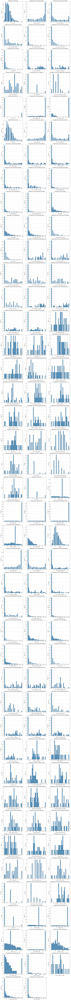

In [11]:
plot_histograms(df)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_log_histograms(df):
    """
    Plots histograms for each numerical variable in the given dataframe after applying log transformation.
    
    Parameters:
        df (pd.DataFrame): The dataframe containing the data.
    """
    num_cols = df.select_dtypes(include=['number']).columns  
    num_vars = len(num_cols)

    if num_vars == 0:
        print("No numerical columns found in the dataframe.")
        return
    
    # Shift data to ensure all values are non-negative
    df_shifted = df[num_cols] - df[num_cols].min() + 1 
    df_log = np.log1p(df_shifted)

    fig, axes = plt.subplots(nrows=(num_vars // 3) + 1, ncols=min(3, num_vars), figsize=(15, 5 * ((num_vars // 3) + 1)))
    axes = axes.flatten()  

    for i, col in enumerate(num_cols):
        axes[i].hist(df_log[col], bins=30, edgecolor='black', alpha=0.7)
        axes[i].set_title(f'Log-Scaled Distribution of {col}')
        axes[i].set_xlabel(f'log(1 + ({col} - min + 1))')
        axes[i].set_ylabel('Frequency')
        axes[i].grid(axis='y', alpha=0.75)

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


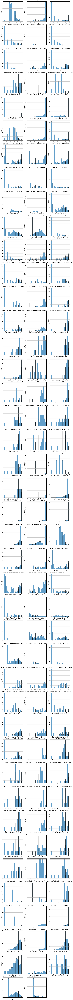

In [15]:
plot_log_histograms(df)

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import boxcox
from sklearn.preprocessing import PowerTransformer

def plot_transformed_histograms(df, transform="log"):
    """
    Plots histograms for each numerical variable after applying a chosen transformation.

    Parameters:
        df (pd.DataFrame): The dataframe containing data.
        transform (str): The transformation type ('log', 'boxcox', 'yeo-johnson', 'sqrt').
    """
    num_cols = df.select_dtypes(include=['number']).columns
    num_vars = len(num_cols)

    if num_vars == 0:
        print("No numerical columns found.")
        return
    
    df_transformed = df[num_cols].copy()
    
    for col in num_cols:
        if transform == "log":
            df_transformed[col] = np.log1p(df_transformed[col] - df_transformed[col].min() + 1)
        elif transform == "boxcox":
            if (df_transformed[col] > 0).all():  # Box-Cox only works for positive values
                df_transformed[col], _ = boxcox(df_transformed[col] + 1e-6)  
            else:
                print(f"Skipping Box-Cox for {col} (contains non-positive values).")
        elif transform == "yeo-johnson":
            pt = PowerTransformer(method="yeo-johnson")
            df_transformed[col] = pt.fit_transform(df_transformed[[col]]).flatten()
        elif transform == "sqrt":
            df_transformed[col] = np.sqrt(df_transformed[col] - df_transformed[col].min() + 1)

    fig, axes = plt.subplots(nrows=(num_vars // 3) + 1, ncols=min(3, num_vars), figsize=(15, 5 * ((num_vars // 3) + 1)))
    axes = axes.flatten()

    for i, col in enumerate(num_cols):
        axes[i].hist(df_transformed[col], bins=30, edgecolor='black', alpha=0.7)
        axes[i].set_title(f'{transform.capitalize()} Transformed {col}')
        axes[i].set_xlabel(f'{transform.capitalize()}({col})')
        axes[i].set_ylabel('Frequency')
        axes[i].grid(axis='y', alpha=0.75)

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


Skipping Box-Cox for 2022 Age (contains non-positive values).
Skipping Box-Cox for 2022 Games Played (contains non-positive values).
Skipping Box-Cox for 2022 Games Started (contains non-positive values).
Skipping Box-Cox for 2022 Interceptions Thrown (contains non-positive values).
Skipping Box-Cox for 2022 Rushing Touchdowns (contains non-positive values).
Skipping Box-Cox for 2022 Receiving Touchdowns (contains non-positive values).
Skipping Box-Cox for 2022 Fumbles (contains non-positive values).
Skipping Box-Cox for 2022 Field Goals Made (contains non-positive values).
Skipping Box-Cox for 2022 Extra Points Made (contains non-positive values).
Skipping Box-Cox for 2022 ST_Interceptions (contains non-positive values).
Skipping Box-Cox for 2022 ST_Safeties (contains non-positive values).
Skipping Box-Cox for 2022 ST_Special Teams Touchdowns (contains non-positive values).
Skipping Box-Cox for 2022 XP2 (contains non-positive values).
Skipping Box-Cox for 2022 Average ADP (contains no

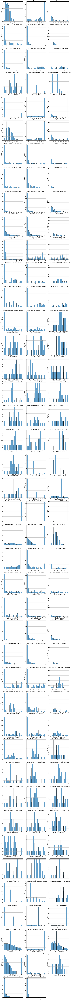

In [18]:
plot_transformed_histograms(df, transform="boxcox")

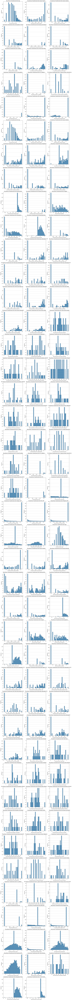

In [19]:
plot_transformed_histograms(df, transform="yeo-johnson")

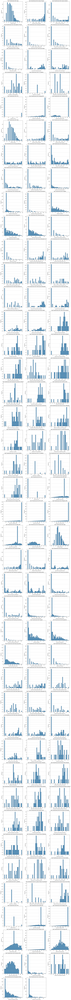

In [20]:
plot_transformed_histograms(df, transform="sqrt")